# estimate $Q_\phi(X)$ for different combination of binary activities

$Q_\phi(X)$ will be used to assess support. 

In [1]:
import os
import numpy as np
from tqdm.notebook import tqdm, trange

In [2]:
from noah2 import data as D
from noah2 import util as U

In [3]:
import copy
import torch
from nflows import transforms, distributions, flows
from torch import optim
from torch.nn.utils.clip_grad import clip_grad_norm_

In [4]:
import corner as DFM
# --- plotting ---
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['axes.xmargin'] = 1
mpl.rcParams['xtick.labelsize'] = 'x-large'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'x-large'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = False
%matplotlib inline

In [5]:
cuda = torch.cuda.is_available()
device = ("cuda:0" if cuda else "cpu")

## load training and testing data

In [6]:
# read full data set
DNoah = D.Noah2()
fema = DNoah._read_data_full(participants=True)

# select outcome and covariates
columns = DNoah._columns()[1:8] + ['s_%s' % c for c in ['c350', 'c420', 'c450']]
column_labels = np.array(DNoah._column_labels()[1:8] + ['c350', 'c420', 'c450'])

data = np.array([np.array(fema[col]) for col in columns]).T

# reduce dynamic scale
_data = data.copy()
_data[:,2] = np.log10(_data[:,2])
_data[:,3] = np.log10(_data[:,3])

In [7]:
# encode different combination of binary activities
binary_activities = ['c360', 'c520', 'c530', 'c540', 'c610', 'c620', 'c630']

binary_data = np.array([np.array(fema[col]) for col in binary_activities]).T
binary_data = (binary_data > 0).astype(int)

binary_act_codes = np.zeros(len(fema))
for i in range(binary_data.shape[1]): 
    binary_act_codes += 2**i * binary_data[:,i]

In [8]:
def uncode(num): 
    act = np.zeros(len(binary_activities)).astype(int)
    while num > 0: 
        ind = int(np.floor(np.log(num)/np.log(2)))
        num = num - 2**ind
        act[ind] = 1
    return act

## downsample same zipcodes
There are many communities from the same zipcode. Lets reduce that.

In [9]:
zuniq, iuniq, nuniq = np.unique(fema['zipcode'], return_index=True, return_counts=True)


n_repeat = 1
remove = np.zeros(data.shape[0]).astype(bool)

for z in zuniq: 
    is_zip = (np.array(fema['zipcode']) == z)
    
    for bcode in np.unique(binary_act_codes[is_zip]): 
        is_bzip = is_zip & (binary_act_codes == bcode)

        if np.sum(is_bzip) > n_repeat:
            _remove = np.random.choice(np.arange(np.sum(is_bzip)), np.sum(is_bzip) - n_repeat, replace=False)
            remove[np.arange(data.shape[0])[is_bzip][_remove]] = True

In [10]:
np.sum(remove)

164184

In [11]:
_data = _data[~remove]
binary_act_codes = binary_act_codes[~remove]

In [12]:
act_enough_stat = []
for code in np.unique(binary_act_codes): 
    ncomm = np.sum(binary_act_codes == code)
    nzip = len(np.unique(fema['zipcode'][~remove][binary_act_codes == code]))
    if nzip < 100: continue
    print(uncode(code))        
    print('%i communities' % ncomm)
    print('%i unique zipcodes' % nzip)
    print()
    act_enough_stat.append(code)

[0 0 0 0 0 0 0]
315 communities
315 unique zipcodes

[0 1 0 0 0 0 0]
118 communities
118 unique zipcodes

[0 0 0 1 0 0 0]
113 communities
113 unique zipcodes

[1 0 0 1 0 0 0]
147 communities
147 unique zipcodes

[0 1 0 1 0 0 0]
119 communities
119 unique zipcodes

[1 1 0 1 1 0 0]
112 communities
112 unique zipcodes

[0 0 0 0 0 0 1]
308 communities
308 unique zipcodes

[0 1 0 0 0 0 1]
234 communities
234 unique zipcodes

[0 0 0 1 0 0 1]
119 communities
119 unique zipcodes

[1 1 0 1 0 0 1]
165 communities
165 unique zipcodes



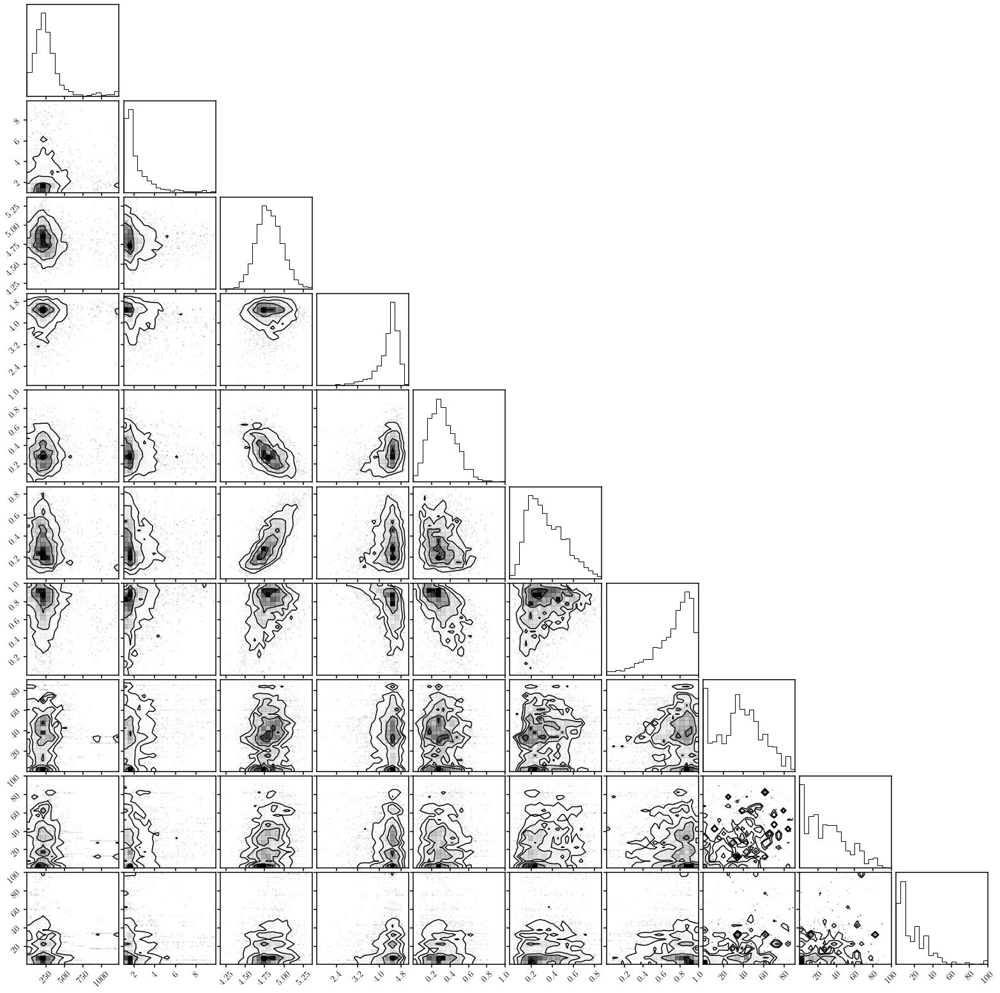

In [13]:
fig = DFM.corner(_data)

# train $Q_\phi(X)$

In [14]:
def train_support(binary_code, batch_size=50, n_blocks=5, n_hidden=128, lrate=1e-3, patience=10, nepoch=1000, clip_max_norm=5): 
    print('training Qphi for', uncode(binary_code))
    data = _data[binary_act_codes == binary_code].copy()
    
    data[:,0] = U.inv_cdf_transform(data[:,0], [-1e-3, 1500])
    data[:,1] = U.inv_cdf_transform(data[:,1], [-1e-3, 10])
    data[:,2] = U.inv_cdf_transform(data[:,2], [3, 6])        
    data[:,3] = U.inv_cdf_transform(data[:,3], [1, 6])        
    data[:,4] = U.inv_cdf_transform(data[:,4], [-1e-3, 1+1e-3])            
    data[:,5] = U.inv_cdf_transform(data[:,5], [-1e-3, 1+1e-3])            
    data[:,6] = U.inv_cdf_transform(data[:,6], [-1e-3, 1+1e-3])      
    # cdf transfer the CRS activities column    
    data[:,-3] = U.inv_cdf_transform(data[:,-3], [-1e-3, 100.+1e-3])
    data[:,-2] = U.inv_cdf_transform(data[:,-2], [-1e-3, 100.+1e-3])
    data[:,-1] = U.inv_cdf_transform(data[:,-1], [-1e-3, 100.+1e-3])    
    
    # shuffle up the data 
    np.random.seed(0)
    ind = np.arange(data.shape[0])
    np.random.shuffle(ind)
    
    # set up training/testing data
    Ntrain = int(0.9 * data.shape[0])
    print('Ntrain= %i, Nvalid= %i' % (Ntrain, data.shape[0] - Ntrain))
    data_train = data[ind][:Ntrain]
    data_valid = data[ind][Ntrain:]
    
    ndim = data.shape[1]
    print('n_dim = %i' % ndim)
    
    train_loader = torch.utils.data.DataLoader(torch.tensor(data_train.astype(np.float32)).to(device), 
                                               batch_size=batch_size, shuffle=True)
    valid_loader = torch.utils.data.DataLoader(torch.tensor(data_valid.astype(np.float32)).to(device), 
                                               batch_size=batch_size, shuffle=False)
    
    # initialize flow 
    blocks = []
    for iblock in range(n_blocks): 
        blocks += [transforms.MaskedAffineAutoregressiveTransform(features=ndim, hidden_features=n_hidden),
                transforms.RandomPermutation(features=ndim)]
    transform = transforms.CompositeTransform(blocks)

    base_distribution = distributions.StandardNormal(shape=[ndim])
    flow = flows.Flow(transform=transform, distribution=base_distribution)
    flow.to(device)

    # train flow
    optimizer = optim.Adam(flow.parameters(), lr=lrate)
    #scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=patience, min_lr=1e-5)
    #optim.lr_scheduler.OneCycleLR(optimizer, lrate, total_steps=num_iter)

    best_epoch, best_valid_loss, valid_losses = 0, np.inf, []
    for epoch in range(nepoch):
        # train 
        flow.train()
        train_loss = 0.
        for batch in train_loader: 
            optimizer.zero_grad()
            loss = -flow.log_prob(batch).mean()
            loss.backward()
            train_loss += loss.item()
            clip_grad_norm_(
                        flow.parameters(), max_norm=clip_max_norm
                    )
            
            optimizer.step()
        train_loss = train_loss/float(len(train_loader))
    
        # validate
        with torch.no_grad():
            valid_loss = 0.
            for batch in valid_loader: 
                loss = -flow.log_prob(batch).mean()
                valid_loss += loss.item()
            valid_loss = valid_loss/len(valid_loader)

            if np.isnan(valid_loss): raise ValueError('nan')

            valid_losses.append(valid_loss)
        #scheduler.step(valid_loss)

        if epoch % 10 == 0: 
            print('Epoch: %i TRAINING Loss: %.2e VALIDATION Loss: %.2e' % 
                          (epoch, train_loss, valid_loss))
            
            #print('Epoch: %i LR %.2e TRAINING Loss: %.2e VALIDATION Loss: %.2e' % 
            #              (epoch, scheduler._last_lr[0], train_loss, valid_loss))
            
        if valid_loss < best_valid_loss: 
            best_valid_loss = valid_loss
            best_epoch = epoch
            best_flow = copy.deepcopy(flow)
        else: 
            if epoch > best_epoch + patience: 
                print('DONE: EPOCH %i, BEST EPOCH %i BEST VALIDATION Loss: %.2e' % 
                          (epoch, best_epoch, best_valid_loss))
                #print('DONE: EPOCH %i, BEST EPOCH %i LR %.2e BEST VALIDATION Loss: %.2e' % 
                #          (epoch, best_epoch, scheduler._last_lr[0], best_valid_loss))
                break 
    return best_flow

def validate_flow(flow, binary): 
    with torch.no_grad(): 
        samp = flow.sample(10000)
        samples = np.array(samp.detach().cpu()).copy()
        samples[:,0] = U.cdf_transform(samples[:,0], [-1e-3, 1500])
        samples[:,1] = U.cdf_transform(samples[:,1], [-1e-3, 10])
        samples[:,2] = U.cdf_transform(samples[:,2], [3, 6])        
        samples[:,3] = U.cdf_transform(samples[:,3], [1, 6])        
        samples[:,4] = U.cdf_transform(samples[:,4], [-1e-3, 1+1e-3])            
        samples[:,5] = U.cdf_transform(samples[:,5], [-1e-3, 1+1e-3])            
        samples[:,6] = U.cdf_transform(samples[:,6], [-1e-3, 1+1e-3])          
        samples[:,-3] = U.cdf_transform(samples[:,-3], [-1e-3, 100.+1e-3])
        samples[:,-2] = U.cdf_transform(samples[:,-2], [-1e-3, 100.+1e-3])
        samples[:,-1] = U.cdf_transform(samples[:,-1], [-1e-3, 100.+1e-3])
    fig = DFM.corner(samples)
    DFM.overplot_points(fig, _data[binary_act_codes == binary])        
    plt.show()
    return None

In [15]:
act_enough_stat

[0.0, 2.0, 8.0, 9.0, 10.0, 27.0, 64.0, 66.0, 72.0, 75.0]

training Qphi for [0 0 0 0 0 0 0]
Ntrain= 283, Nvalid= 32
n_dim = 10
Epoch: 0 TRAINING Loss: 2.67e+01 VALIDATION Loss: 2.48e+01
Epoch: 10 TRAINING Loss: 9.32e+00 VALIDATION Loss: 7.77e+00
Epoch: 20 TRAINING Loss: 7.42e+00 VALIDATION Loss: 6.23e+00
Epoch: 30 TRAINING Loss: 6.71e+00 VALIDATION Loss: 5.45e+00
Epoch: 40 TRAINING Loss: 6.37e+00 VALIDATION Loss: 5.07e+00
Epoch: 50 TRAINING Loss: 6.05e+00 VALIDATION Loss: 4.98e+00
Epoch: 60 TRAINING Loss: 5.89e+00 VALIDATION Loss: 4.76e+00
Epoch: 70 TRAINING Loss: 5.52e+00 VALIDATION Loss: 4.62e+00
Epoch: 80 TRAINING Loss: 5.34e+00 VALIDATION Loss: 4.57e+00
Epoch: 90 TRAINING Loss: 5.06e+00 VALIDATION Loss: 4.32e+00
Epoch: 100 TRAINING Loss: 4.90e+00 VALIDATION Loss: 4.49e+00
Epoch: 110 TRAINING Loss: 4.54e+00 VALIDATION Loss: 4.42e+00
Epoch: 120 TRAINING Loss: 4.48e+00 VALIDATION Loss: 4.65e+00
Epoch: 130 TRAINING Loss: 4.28e+00 VALIDATION Loss: 4.15e+00
Epoch: 140 TRAINING Loss: 4.27e+00 VALIDATION Loss: 4.25e+00
Epoch: 150 TRAINING Loss: 4

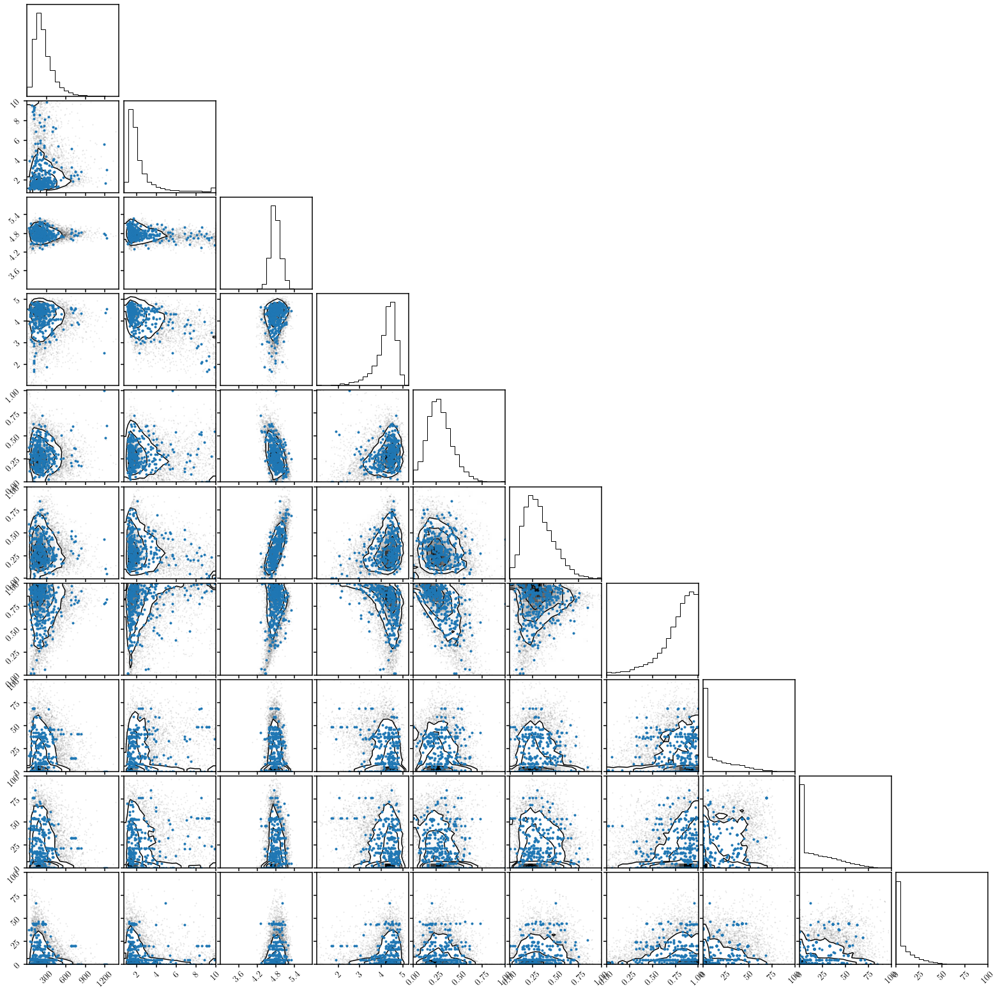

training Qphi for [0 1 0 0 0 0 0]
Ntrain= 106, Nvalid= 12
n_dim = 10
Epoch: 0 TRAINING Loss: 2.73e+01 VALIDATION Loss: 2.65e+01
Epoch: 10 TRAINING Loss: 1.36e+01 VALIDATION Loss: 1.30e+01
Epoch: 20 TRAINING Loss: 7.50e+00 VALIDATION Loss: 6.99e+00
Epoch: 30 TRAINING Loss: 6.19e+00 VALIDATION Loss: 5.88e+00
Epoch: 40 TRAINING Loss: 4.63e+00 VALIDATION Loss: 5.44e+00
Epoch: 50 TRAINING Loss: 4.41e+00 VALIDATION Loss: 5.09e+00
Epoch: 60 TRAINING Loss: 4.28e+00 VALIDATION Loss: 5.00e+00
Epoch: 70 TRAINING Loss: 3.72e+00 VALIDATION Loss: 4.86e+00
DONE: EPOCH 78, BEST EPOCH 57 BEST VALIDATION Loss: 4.36e+00


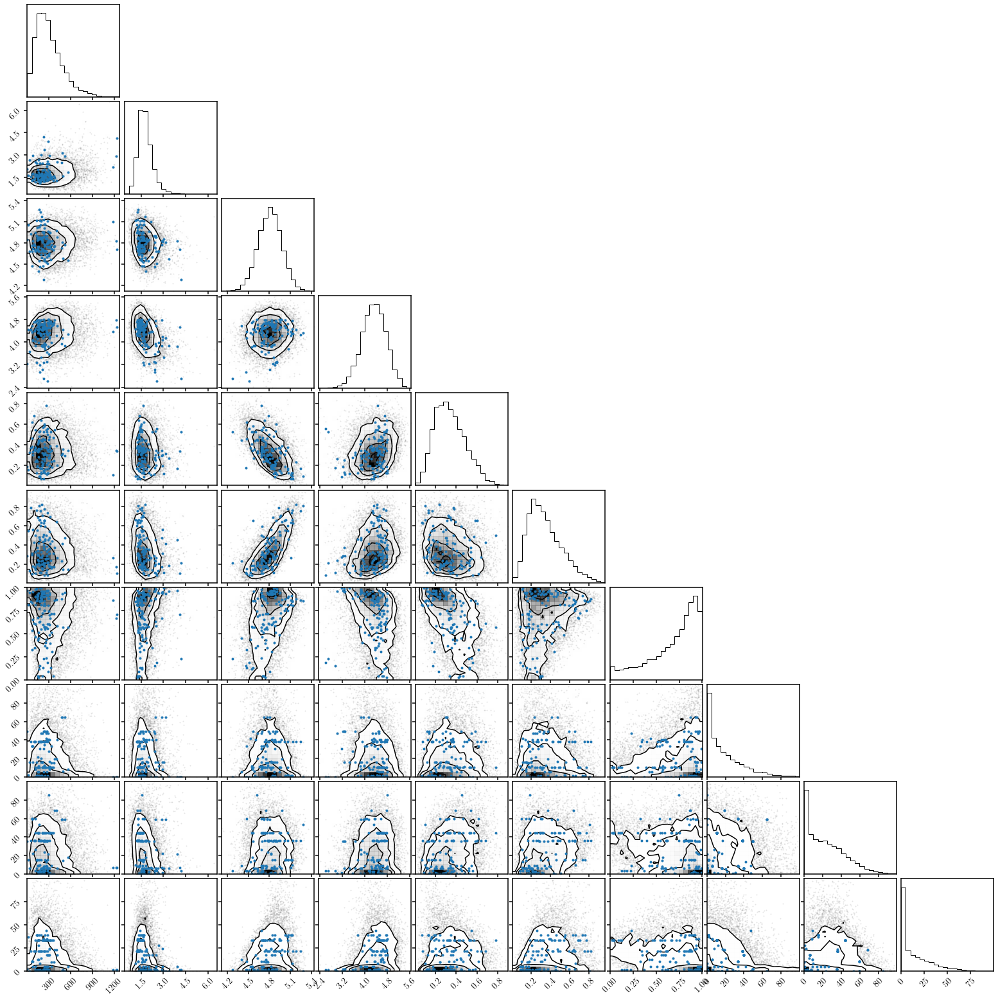

training Qphi for [0 0 0 1 0 0 0]
Ntrain= 101, Nvalid= 12
n_dim = 10
Epoch: 0 TRAINING Loss: 2.68e+01 VALIDATION Loss: 2.58e+01
Epoch: 10 TRAINING Loss: 1.37e+01 VALIDATION Loss: 1.21e+01
Epoch: 20 TRAINING Loss: 7.56e+00 VALIDATION Loss: 7.33e+00
Epoch: 30 TRAINING Loss: 6.70e+00 VALIDATION Loss: 6.50e+00
Epoch: 40 TRAINING Loss: 5.30e+00 VALIDATION Loss: 5.78e+00
Epoch: 50 TRAINING Loss: 5.30e+00 VALIDATION Loss: 5.70e+00
Epoch: 60 TRAINING Loss: 3.20e+00 VALIDATION Loss: 5.86e+00
Epoch: 70 TRAINING Loss: 5.56e+00 VALIDATION Loss: 6.16e+00
DONE: EPOCH 74, BEST EPOCH 53 BEST VALIDATION Loss: 5.25e+00


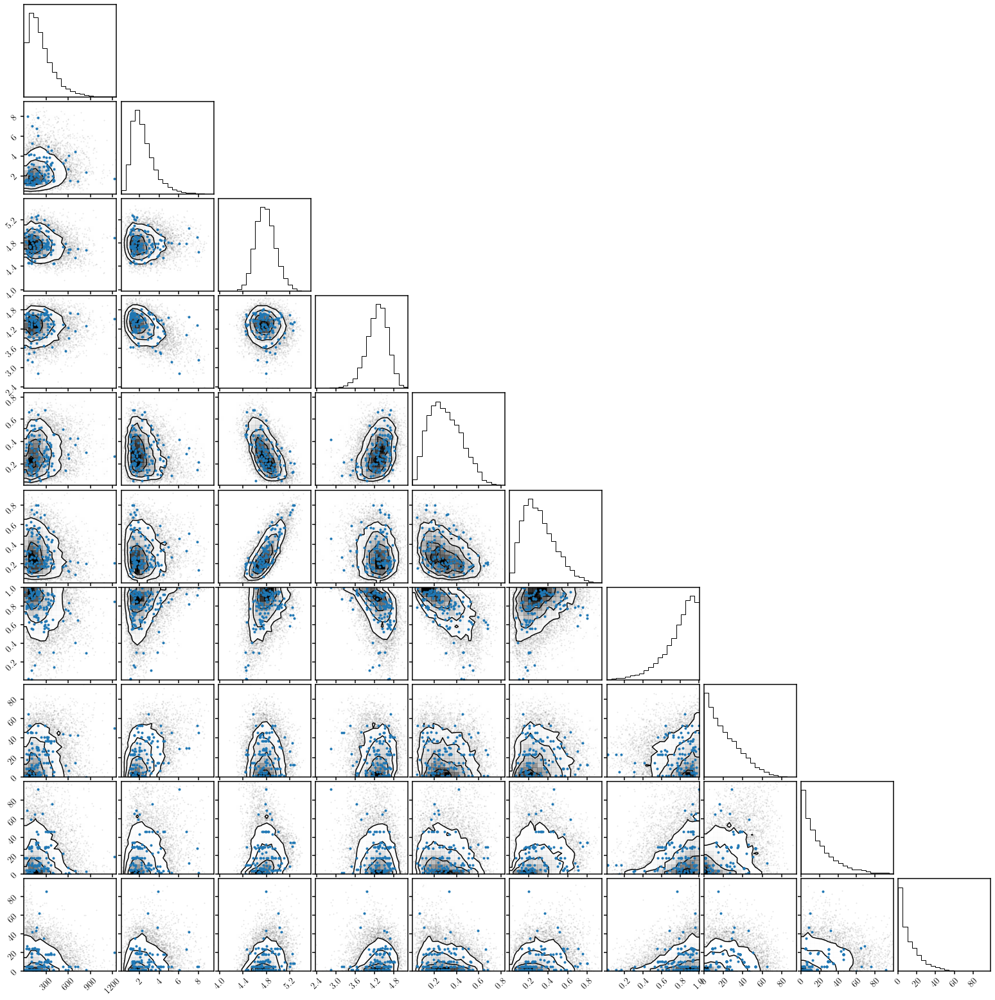

training Qphi for [1 0 0 1 0 0 0]
Ntrain= 132, Nvalid= 15
n_dim = 10
Epoch: 0 TRAINING Loss: 2.68e+01 VALIDATION Loss: 2.61e+01
Epoch: 10 TRAINING Loss: 1.17e+01 VALIDATION Loss: 1.13e+01
Epoch: 20 TRAINING Loss: 5.79e+00 VALIDATION Loss: 7.44e+00
Epoch: 30 TRAINING Loss: 4.08e+00 VALIDATION Loss: 6.12e+00
Epoch: 40 TRAINING Loss: 3.44e+00 VALIDATION Loss: 5.98e+00
Epoch: 50 TRAINING Loss: 2.98e+00 VALIDATION Loss: 5.39e+00
Epoch: 60 TRAINING Loss: 2.52e+00 VALIDATION Loss: 5.25e+00
DONE: EPOCH 69, BEST EPOCH 48 BEST VALIDATION Loss: 5.11e+00


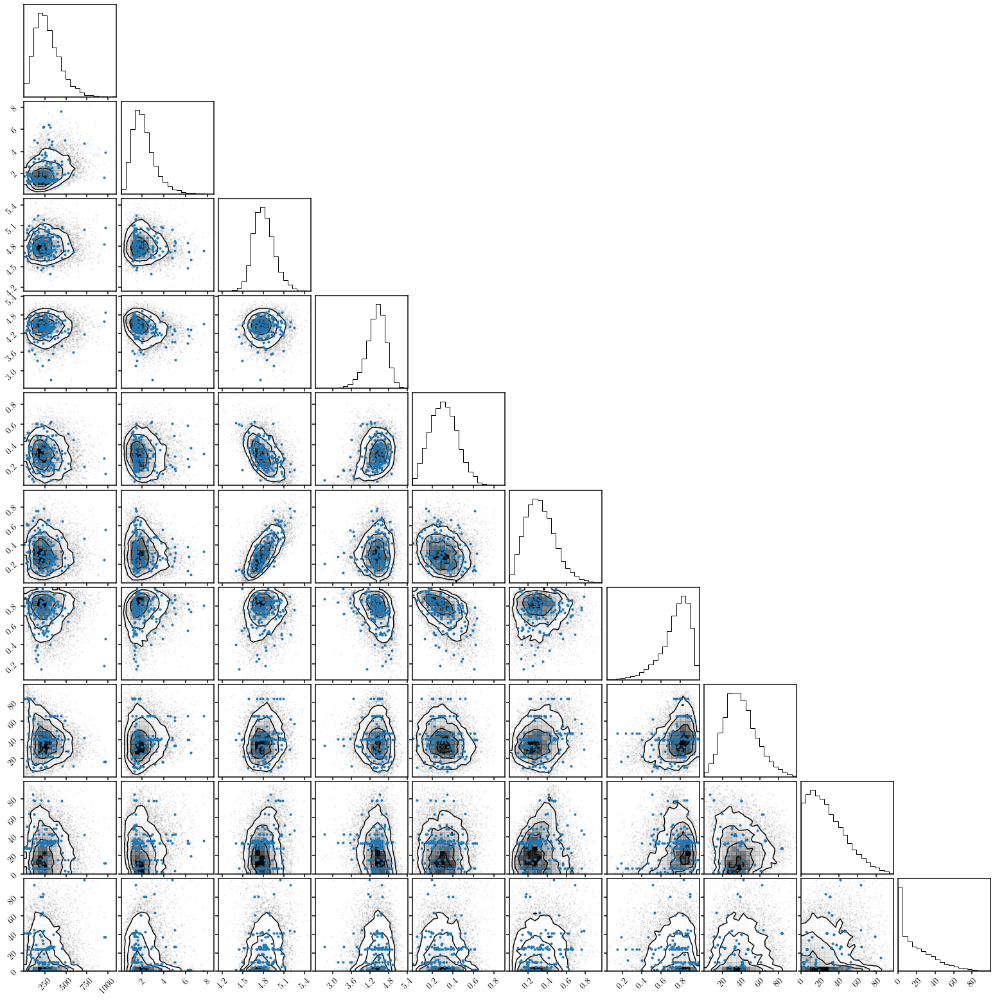

training Qphi for [0 1 0 1 0 0 0]
Ntrain= 107, Nvalid= 12
n_dim = 10
Epoch: 0 TRAINING Loss: 2.67e+01 VALIDATION Loss: 2.61e+01
Epoch: 10 TRAINING Loss: 1.23e+01 VALIDATION Loss: 1.91e+01
Epoch: 20 TRAINING Loss: 4.74e+00 VALIDATION Loss: 1.04e+01
Epoch: 30 TRAINING Loss: 3.68e+00 VALIDATION Loss: 9.31e+00
Epoch: 40 TRAINING Loss: 6.21e-01 VALIDATION Loss: 3.24e+00
Epoch: 50 TRAINING Loss: -1.93e+00 VALIDATION Loss: 1.13e+00
Epoch: 60 TRAINING Loss: -2.85e+00 VALIDATION Loss: -7.49e-02
Epoch: 70 TRAINING Loss: -4.12e+00 VALIDATION Loss: -2.97e-01
Epoch: 80 TRAINING Loss: -4.77e+00 VALIDATION Loss: -1.35e+00
Epoch: 90 TRAINING Loss: -2.78e+00 VALIDATION Loss: 1.44e+00
Epoch: 100 TRAINING Loss: -3.94e+00 VALIDATION Loss: -1.37e+00
Epoch: 110 TRAINING Loss: -5.60e+00 VALIDATION Loss: -2.03e+00
Epoch: 120 TRAINING Loss: -6.40e+00 VALIDATION Loss: -1.74e+00
Epoch: 130 TRAINING Loss: -6.79e+00 VALIDATION Loss: -4.92e-01
Epoch: 140 TRAINING Loss: -6.94e+00 VALIDATION Loss: -3.56e+00
Epoch: 15

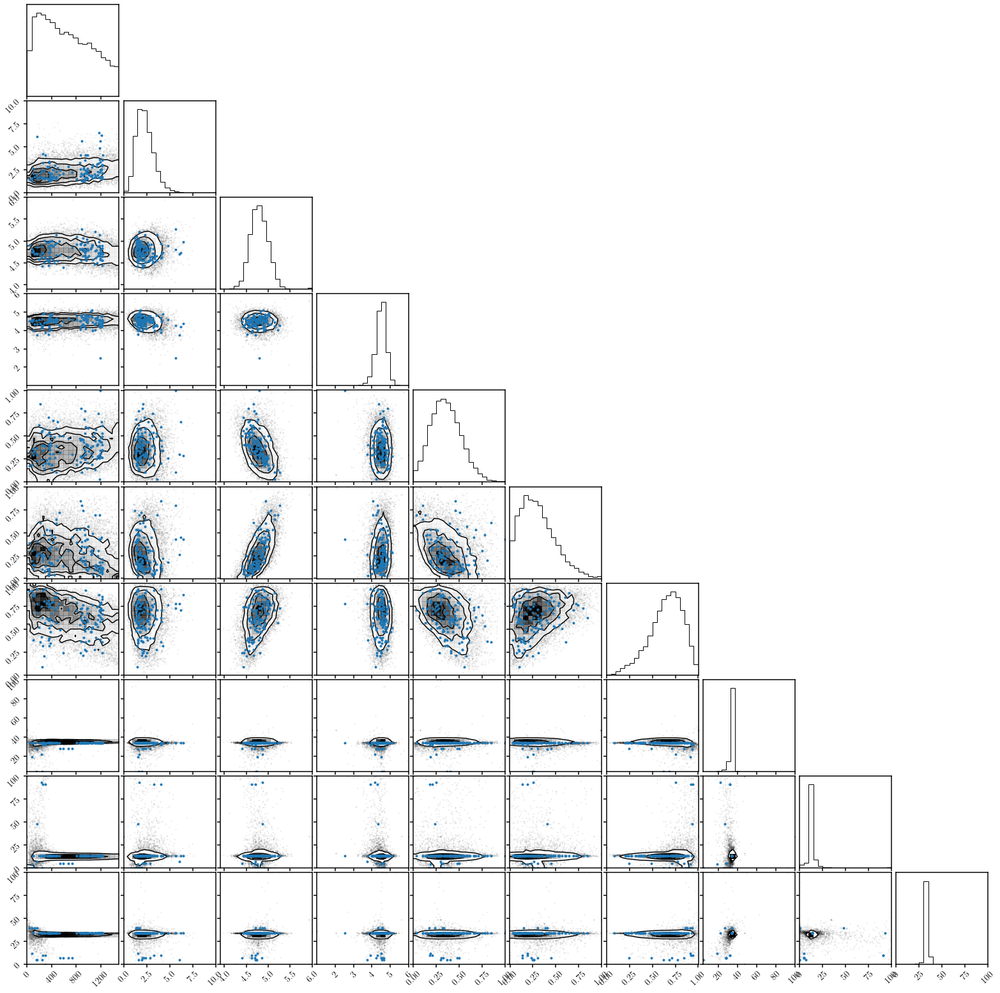

training Qphi for [1 1 0 1 1 0 0]
Ntrain= 100, Nvalid= 12
n_dim = 10
Epoch: 0 TRAINING Loss: 2.76e+01 VALIDATION Loss: 2.71e+01
Epoch: 10 TRAINING Loss: 1.80e+01 VALIDATION Loss: 1.69e+01
Epoch: 20 TRAINING Loss: 7.01e+00 VALIDATION Loss: 6.48e+00
Epoch: 30 TRAINING Loss: 3.47e+00 VALIDATION Loss: 2.91e+00
Epoch: 40 TRAINING Loss: 1.79e+00 VALIDATION Loss: 1.47e+00
Epoch: 50 TRAINING Loss: 8.62e-01 VALIDATION Loss: 7.80e-01
Epoch: 60 TRAINING Loss: 3.46e-01 VALIDATION Loss: 1.27e-01
Epoch: 70 TRAINING Loss: 8.03e-04 VALIDATION Loss: -9.54e-02
Epoch: 80 TRAINING Loss: -6.52e-01 VALIDATION Loss: -3.46e-01
Epoch: 90 TRAINING Loss: -9.19e-01 VALIDATION Loss: -4.42e-01
Epoch: 100 TRAINING Loss: -1.50e+00 VALIDATION Loss: -1.13e+00
Epoch: 110 TRAINING Loss: -1.95e+00 VALIDATION Loss: -1.39e+00
Epoch: 120 TRAINING Loss: -2.41e+00 VALIDATION Loss: -1.86e+00
Epoch: 130 TRAINING Loss: -2.68e+00 VALIDATION Loss: -1.77e+00
Epoch: 140 TRAINING Loss: -3.01e+00 VALIDATION Loss: -1.90e+00
DONE: EPOCH 

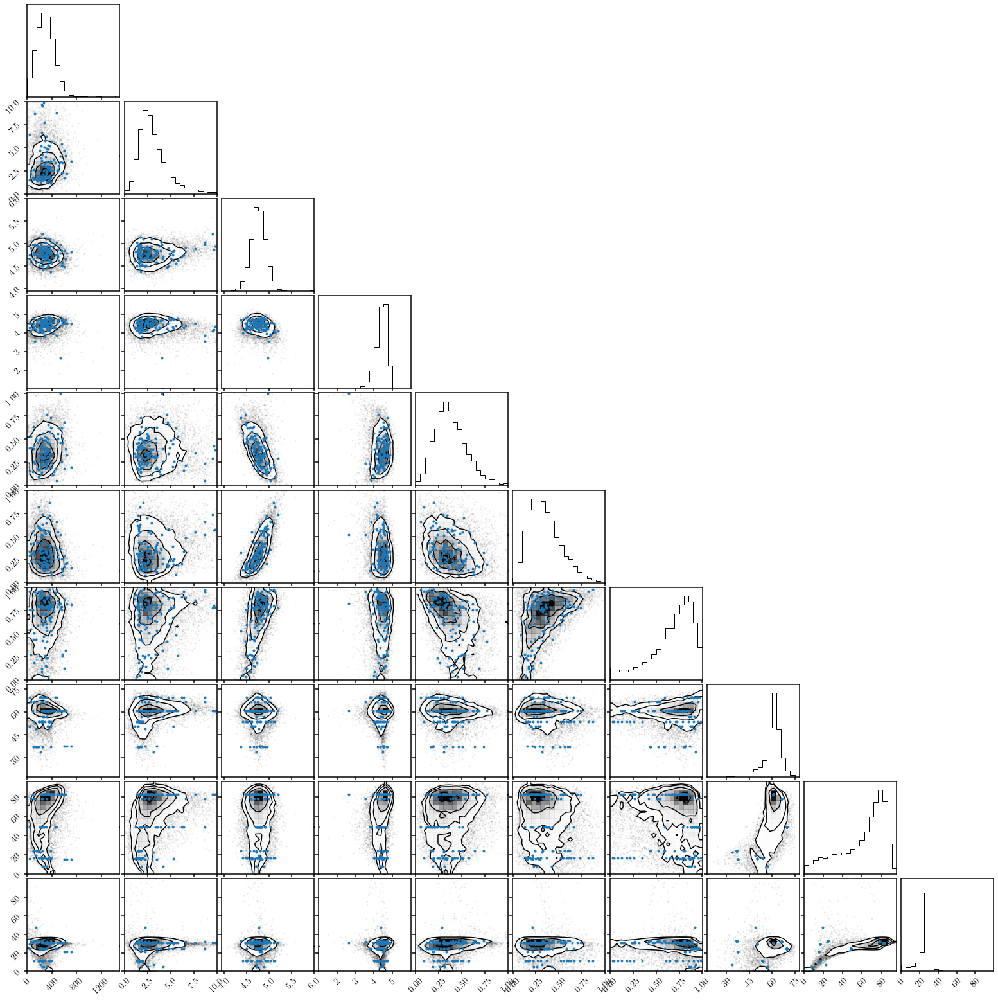

training Qphi for [0 0 0 0 0 0 1]
Ntrain= 277, Nvalid= 31
n_dim = 10
Epoch: 0 TRAINING Loss: 2.71e+01 VALIDATION Loss: 2.54e+01
Epoch: 10 TRAINING Loss: 7.26e+00 VALIDATION Loss: 7.06e+00
Epoch: 20 TRAINING Loss: 5.55e+00 VALIDATION Loss: 6.56e+00
Epoch: 30 TRAINING Loss: 4.94e+00 VALIDATION Loss: 6.02e+00
Epoch: 40 TRAINING Loss: 4.64e+00 VALIDATION Loss: 6.07e+00
Epoch: 50 TRAINING Loss: 4.45e+00 VALIDATION Loss: 6.24e+00
Epoch: 60 TRAINING Loss: 4.35e+00 VALIDATION Loss: 5.69e+00
Epoch: 70 TRAINING Loss: 4.15e+00 VALIDATION Loss: 6.40e+00
DONE: EPOCH 76, BEST EPOCH 55 BEST VALIDATION Loss: 5.52e+00


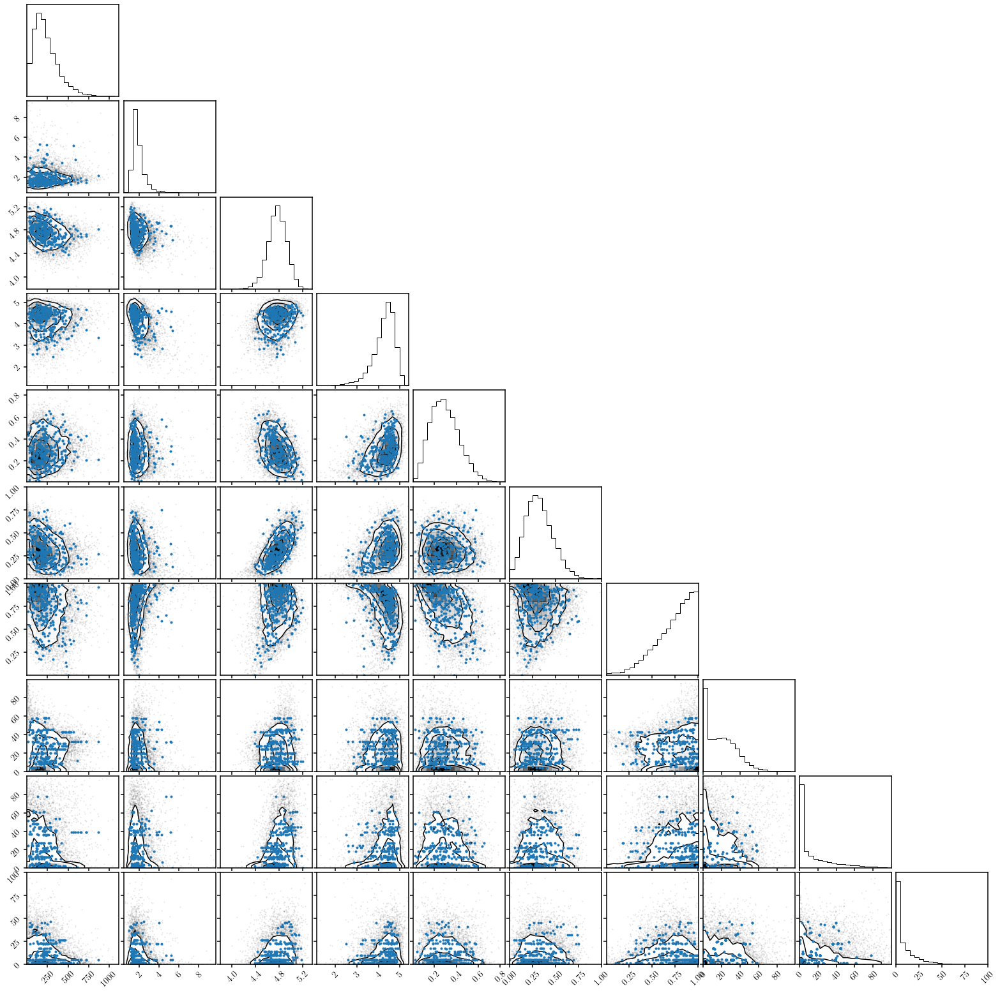

training Qphi for [0 1 0 0 0 0 1]
Ntrain= 210, Nvalid= 24
n_dim = 10
Epoch: 0 TRAINING Loss: 2.68e+01 VALIDATION Loss: 2.54e+01
Epoch: 10 TRAINING Loss: 8.36e+00 VALIDATION Loss: 9.51e+00
Epoch: 20 TRAINING Loss: 4.79e+00 VALIDATION Loss: 6.49e+00
Epoch: 30 TRAINING Loss: 3.87e+00 VALIDATION Loss: 6.31e+00
Epoch: 40 TRAINING Loss: 3.56e+00 VALIDATION Loss: 6.25e+00
DONE: EPOCH 49, BEST EPOCH 28 BEST VALIDATION Loss: 5.77e+00


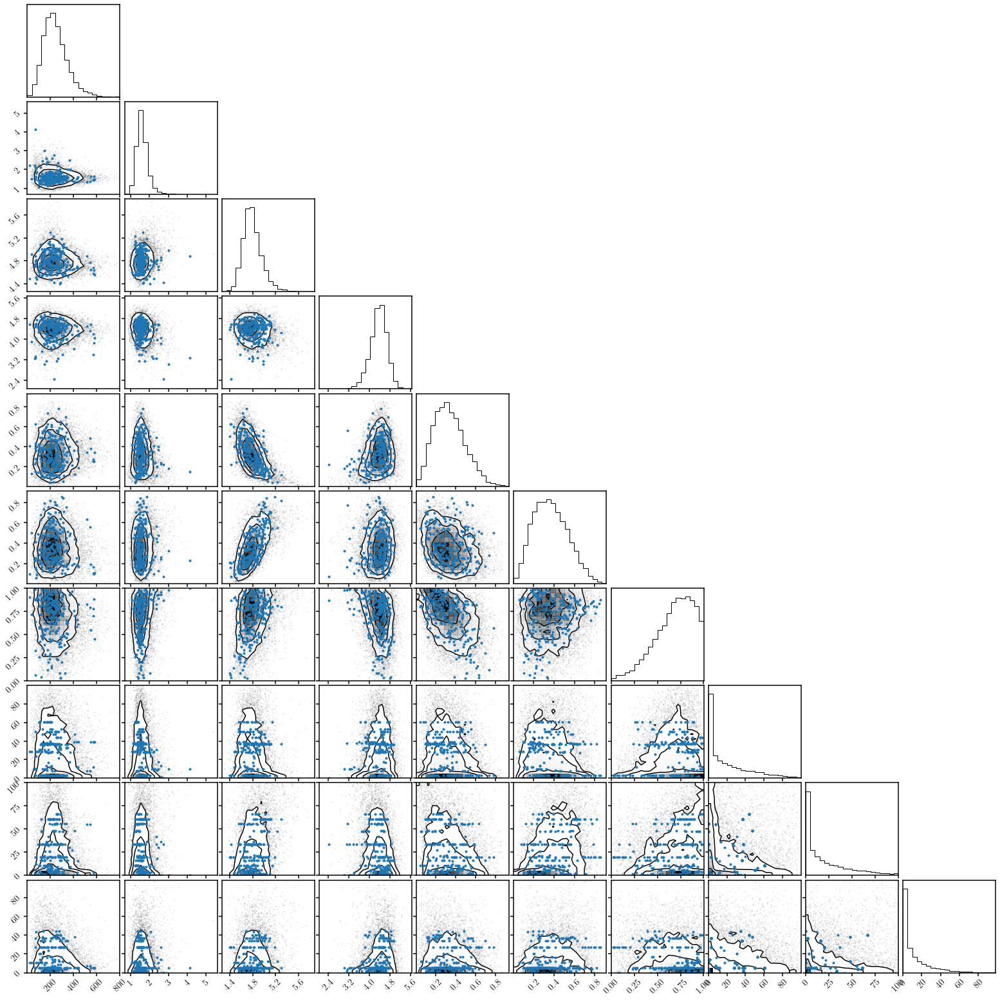

training Qphi for [0 0 0 1 0 0 1]
Ntrain= 107, Nvalid= 12
n_dim = 10
Epoch: 0 TRAINING Loss: 2.86e+01 VALIDATION Loss: 2.76e+01
Epoch: 10 TRAINING Loss: 1.21e+01 VALIDATION Loss: 1.06e+01
Epoch: 20 TRAINING Loss: 3.96e+00 VALIDATION Loss: 6.17e+00
Epoch: 30 TRAINING Loss: 2.76e+00 VALIDATION Loss: 4.56e+00
Epoch: 40 TRAINING Loss: 2.02e+00 VALIDATION Loss: 3.87e+00
Epoch: 50 TRAINING Loss: 9.41e-01 VALIDATION Loss: 4.70e+00
Epoch: 60 TRAINING Loss: 1.32e+00 VALIDATION Loss: 4.51e+00
Epoch: 70 TRAINING Loss: 6.50e-01 VALIDATION Loss: 4.34e+00
Epoch: 80 TRAINING Loss: 1.27e-01 VALIDATION Loss: 4.85e+00
DONE: EPOCH 84, BEST EPOCH 63 BEST VALIDATION Loss: 3.24e+00


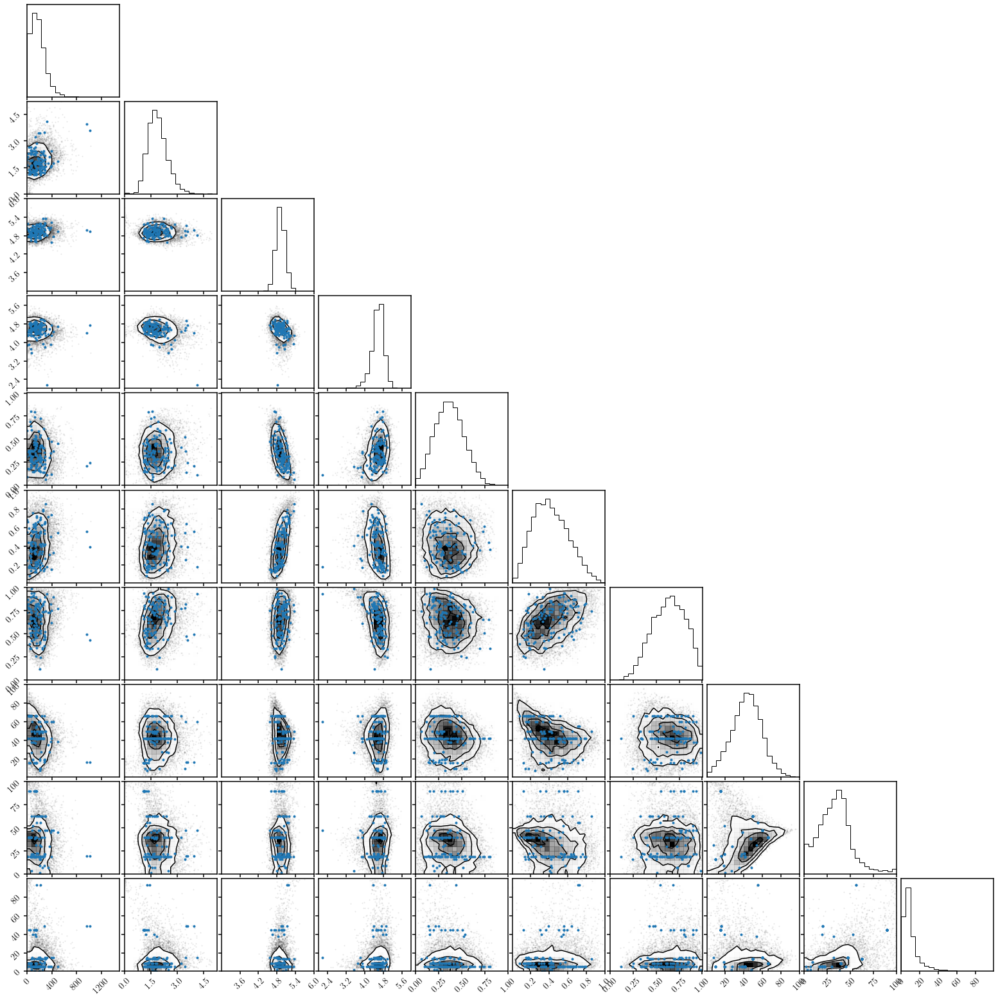

training Qphi for [1 1 0 1 0 0 1]
Ntrain= 148, Nvalid= 17
n_dim = 10
Epoch: 0 TRAINING Loss: 2.71e+01 VALIDATION Loss: 2.63e+01
Epoch: 10 TRAINING Loss: 1.17e+01 VALIDATION Loss: 1.00e+01
Epoch: 20 TRAINING Loss: 5.36e+00 VALIDATION Loss: 4.79e+00
Epoch: 30 TRAINING Loss: 3.35e+00 VALIDATION Loss: 3.02e+00
Epoch: 40 TRAINING Loss: 1.99e+00 VALIDATION Loss: 1.82e+00
Epoch: 50 TRAINING Loss: 1.51e+00 VALIDATION Loss: 1.32e+00
Epoch: 60 TRAINING Loss: 1.02e+00 VALIDATION Loss: 8.49e-01
Epoch: 70 TRAINING Loss: 5.09e-01 VALIDATION Loss: 4.62e-01
Epoch: 80 TRAINING Loss: 1.79e-01 VALIDATION Loss: 5.13e-02
Epoch: 90 TRAINING Loss: -3.23e-01 VALIDATION Loss: -9.37e-02
Epoch: 100 TRAINING Loss: -6.74e-01 VALIDATION Loss: -2.04e-01
Epoch: 110 TRAINING Loss: -1.02e+00 VALIDATION Loss: -6.50e-01
Epoch: 120 TRAINING Loss: -1.40e+00 VALIDATION Loss: 7.45e-02
Epoch: 130 TRAINING Loss: -1.63e+00 VALIDATION Loss: -5.74e-01
Epoch: 140 TRAINING Loss: -1.85e+00 VALIDATION Loss: -6.54e-01
Epoch: 150 TRAIN

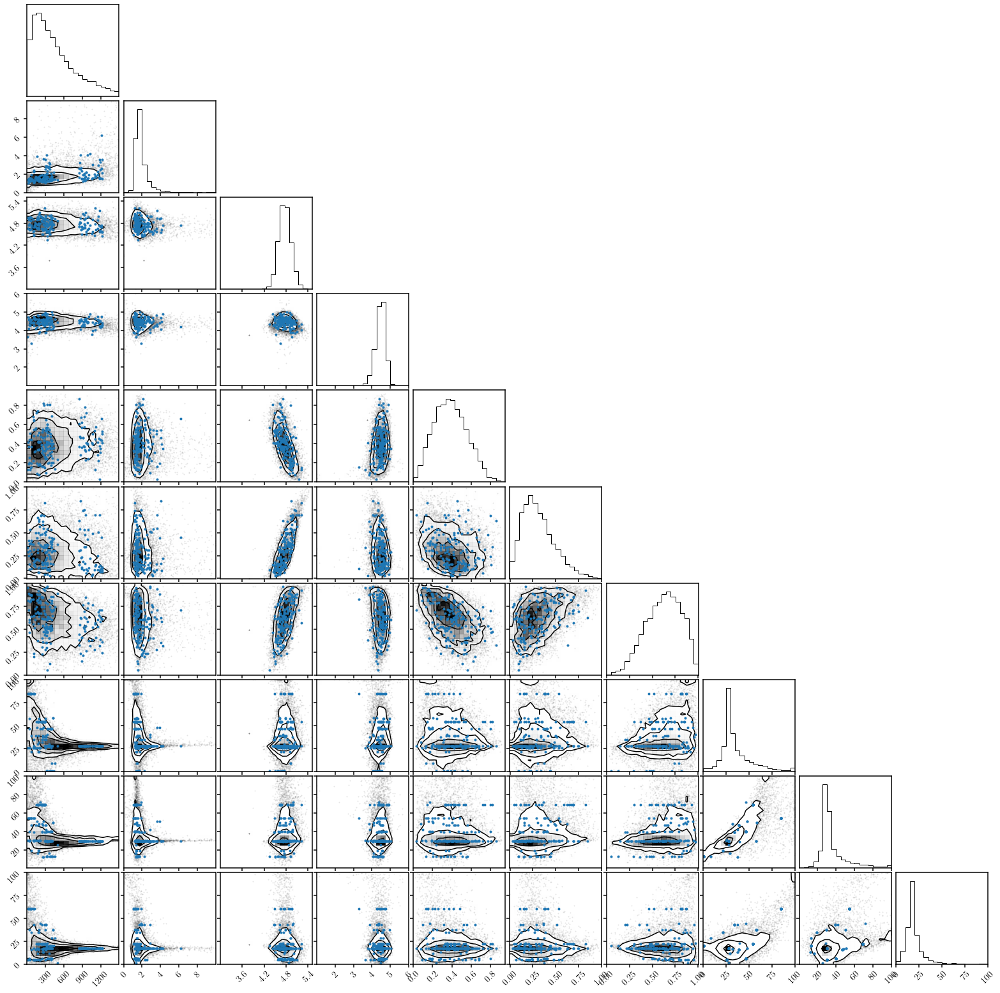

In [17]:
for code in act_enough_stat: 
    _flow = train_support(code, batch_size=50, n_blocks=5, n_hidden=128, lrate=5e-4, patience=20)
    validate_flow(_flow, code)
    torch.save(_flow, '../dat/qphi/noah2.Qphi_support.binary%i.prelim.pt' % int(code))